## how does VQGAN+CLIP work?
###Vector Quantized GAN and CLIP are actually two separate machine learning algorithms that can be used together to generate images based on a text prompt. VQGAN is a generative adversarial neural network that is good at generating images that look similar to others (but not from a prompt), and CLIP is another neural network that is able to determine how well a caption (or prompt) matches an image.

In [4]:
from IPython.utils import io
with io.capture_output() as captured:
  !git clone https://github.com/openai/CLIP
  # !pip install taming-transformers
  !git clone https://github.com/CompVis/taming-transformers.git
  !rm -Rf clipit
  !git clone https://github.com/mfrashad/clipit.git
  !pip install ftfy regex tqdm omegaconf pytorch-lightning
  !pip install kornia
  !pip install imageio-ffmpeg   
  !pip install einops
  !pip install torch-optimizer
  !pip install easydict
  !pip install braceexpand
  !pip install git+https://github.com/pvigier/perlin-numpy

  # ClipDraw deps
  !pip install svgwrite
  !pip install svgpathtools
  !pip install cssutils
  !pip install numba
  !pip install torch-tools
  !pip install visdom

  !pip install gradio

  !git clone https://github.com/BachiLi/diffvg
  %cd diffvg
  # !ls
  !git submodule update --init --recursive
  !python setup.py install
  %cd ..
  
  !mkdir -p steps
  !mkdir -p models

In [5]:
import sys
sys.path.append("clipit")
import clipit
def myfunction(prompts):


# To reset settings to default
  clipit.reset_settings()

# You can use "|" to separate multiple prompts
#prompts = "A one petal flower that is white with a cluster of yellow anther filaments in the center"

# You can trade off speed for quality: draft, normal, better, best
  quality = "normal"

# Aspect ratio: widescreen, square
  aspect = "widescreen"

# Add settings
  clipit.add_settings(prompts=prompts, quality=quality, aspect=aspect)

  #clipit.add_settings(iterations=350)
# Apply these settings and run
  settings = clipit.apply_settings()
  clipit.do_init(settings)
  clipit.do_run(settings)

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)2277376/45929032 bytes (5.0%)5431296/45929032 bytes (11.8%)8798208/45929032 bytes (19.2%)12173312/45929032 bytes (26.5%)15515648/45929032 bytes (33.8%)18808832/45929032 bytes (41.0%)21946368/45929032 bytes (47.8%)25149440/45929032 bytes (54.8%)28254208/45929032 bytes (61.5%)31408128/45929032 bytes (68.4%)34504704/45929032 bytes (75.1%)37855232/45929032 bytes (82.4%)

##reading listofobjects file

In [6]:
import pandas as pd
df=pd.read_csv("/content/listofobjects - Sheet1.csv")
df.head()

,COLOURS,OBJECTS
0,Amaranth,Armoire
1,Amber,Backpack
2,Amethyst,Bedding
3,Apricot,Bedspread
4,Aquamarine,Binders


## Here i convert columns to list so we can easily get random text from list.

In [7]:
list1 = df['COLOURS'].tolist()
list2 = df['OBJECTS'].tolist()

##here using **Choice** class we get random text from  both list after this i cancatenate both text in **prompts** variable

In [8]:
 import random
 random_word1=random.choice(list1)
 random_word2 =random.choice(list2)

In [9]:
prompts=random_word1 + random_word2
prompts

'PurpleNotepaper'

In [10]:
def display_image():
  myfunction(prompts=prompts)

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

8.19kB [00:00, 502kB/s]                    


loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt


100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 119MiB/s]
100%|████████████████████████████████████████| 335M/335M [00:02<00:00, 120MiB/s]


Using device: cuda:0
Optimising using: Adam
Using text prompts: ['PurpleNotepaper']
Using seed: 6015867370550571707


0it [00:00, ?it/s]

iter: 0, loss: 1.71023, losses: 0.852371, 0.85786


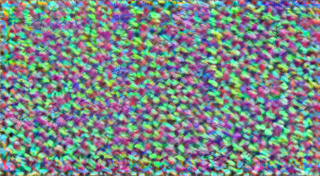

iter: 10, loss: 1.60363, losses: 0.801657, 0.80197
iter: 20, loss: 1.563, losses: 0.785047, 0.777952


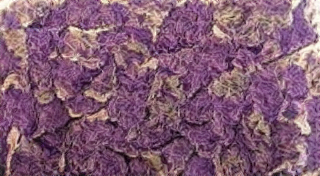

iter: 30, loss: 1.5415, losses: 0.774432, 0.76707
iter: 40, loss: 1.56175, losses: 0.785507, 0.776239


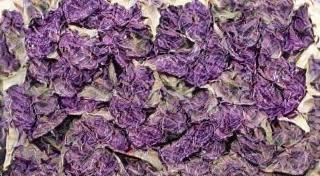

iter: 50, loss: 1.55459, losses: 0.777335, 0.777254
iter: 60, loss: 1.53189, losses: 0.769948, 0.76194


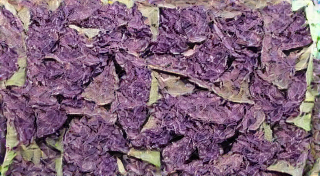

iter: 70, loss: 1.54098, losses: 0.77201, 0.768966
iter: 80, loss: 1.53026, losses: 0.767511, 0.762746


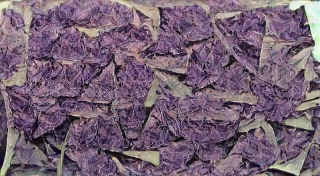

iter: 90, loss: 1.53145, losses: 0.768502, 0.76295
iter: 100, loss: 1.5448, losses: 0.777334, 0.767463


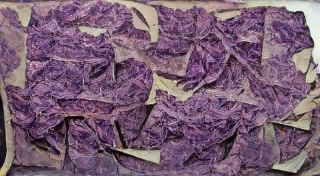

iter: 110, loss: 1.53068, losses: 0.768387, 0.762289
iter: 120, loss: 1.53731, losses: 0.772085, 0.76522


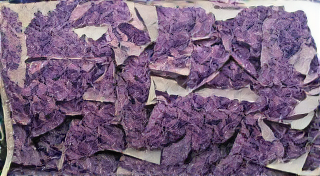

iter: 130, loss: 1.51888, losses: 0.761436, 0.75744
iter: 140, loss: 1.51274, losses: 0.762994, 0.74975


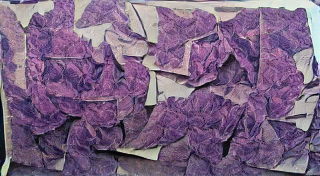

iter: 150, loss: 1.53065, losses: 0.7641, 0.766547
iter: 160, loss: 1.5184, losses: 0.763833, 0.754563


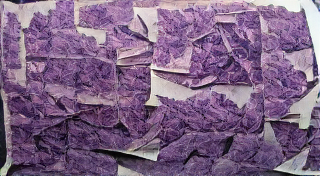

iter: 170, loss: 1.53231, losses: 0.768836, 0.76347
iter: 180, loss: 1.52465, losses: 0.768042, 0.756608


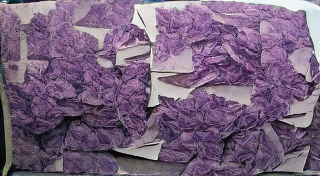

iter: 190, loss: 1.51285, losses: 0.764243, 0.748608
iter: 200, loss: 1.52218, losses: 0.765724, 0.756453


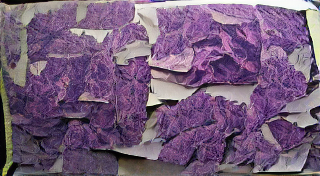

iter: 210, loss: 1.51119, losses: 0.763072, 0.748116
iter: 220, loss: 1.49319, losses: 0.754929, 0.738263


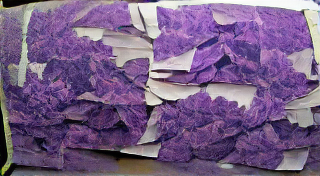

iter: 230, loss: 1.51411, losses: 0.765655, 0.748455
iter: 240, loss: 1.50484, losses: 0.761545, 0.743291


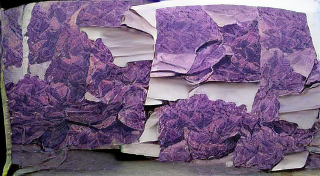

iter: 250, loss: 1.51243, losses: 0.767513, 0.744917
iter: 260, loss: 1.47877, losses: 0.754021, 0.724749


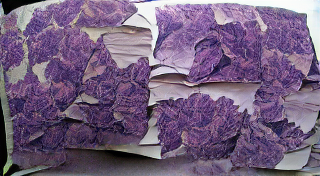

iter: 270, loss: 1.50877, losses: 0.762749, 0.746022
iter: 280, loss: 1.50118, losses: 0.756044, 0.745135


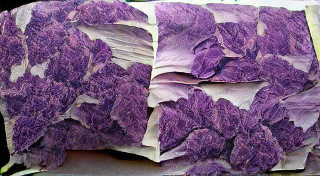

iter: 290, loss: 1.46382, losses: 0.742725, 0.721092
iter: 300, loss: 1.48297, losses: 0.749543, 0.733427


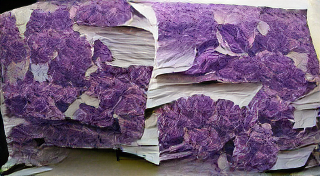

iter: 310, loss: 1.48555, losses: 0.750251, 0.735303
iter: 320, loss: 1.46169, losses: 0.73779, 0.7239


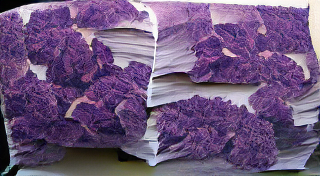

iter: 330, loss: 1.48395, losses: 0.748582, 0.735367
iter: 340, loss: 1.45954, losses: 0.733615, 0.725928


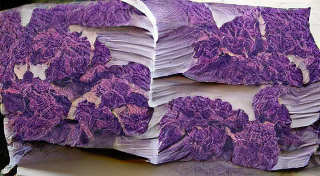

iter: 350, loss: 1.4613, losses: 0.737002, 0.724301


In [11]:
display_image()

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt
Using device: cuda:0
Optimising using: Adam
Using text prompts: ['underwater city']
Using seed: 9002007498146863066


0it [00:00, ?it/s]

iter: 0, loss: 1.8545, losses: 0.935633, 0.918869


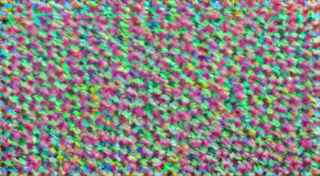

iter: 10, loss: 1.61002, losses: 0.811596, 0.798428
iter: 20, loss: 1.51894, losses: 0.754096, 0.764849


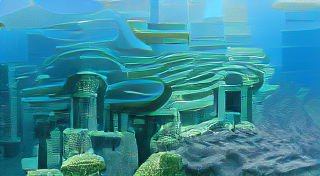

iter: 30, loss: 1.52054, losses: 0.755805, 0.764733
iter: 40, loss: 1.50409, losses: 0.745142, 0.758945


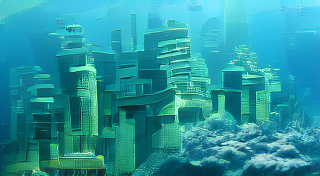

iter: 50, loss: 1.48913, losses: 0.739871, 0.74926
iter: 60, loss: 1.46594, losses: 0.726214, 0.739724


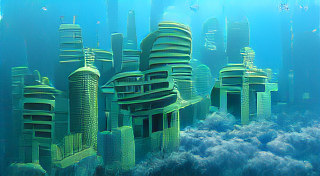

iter: 70, loss: 1.46732, losses: 0.730691, 0.736629
iter: 80, loss: 1.4605, losses: 0.725465, 0.735034


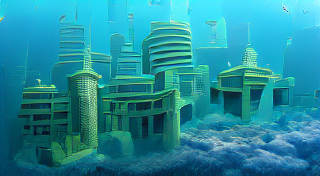

iter: 90, loss: 1.46079, losses: 0.721613, 0.739181
iter: 100, loss: 1.41479, losses: 0.701081, 0.713707


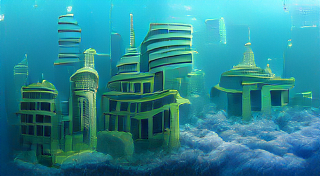

iter: 110, loss: 1.47378, losses: 0.729434, 0.744341
iter: 120, loss: 1.44343, losses: 0.715725, 0.727703


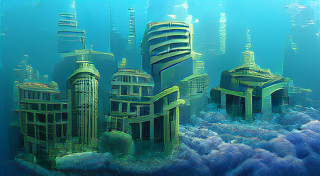

iter: 130, loss: 1.46265, losses: 0.725535, 0.737116
iter: 140, loss: 1.43602, losses: 0.710939, 0.725077


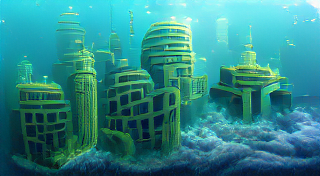

iter: 150, loss: 1.4361, losses: 0.709669, 0.726428
iter: 160, loss: 1.39889, losses: 0.691266, 0.707623


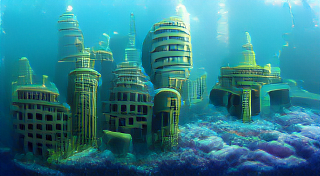

iter: 170, loss: 1.3966, losses: 0.685509, 0.711089
iter: 180, loss: 1.40064, losses: 0.688379, 0.712257


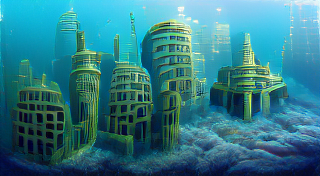

iter: 190, loss: 1.39707, losses: 0.689139, 0.707928
iter: 200, loss: 1.39778, losses: 0.689374, 0.708405


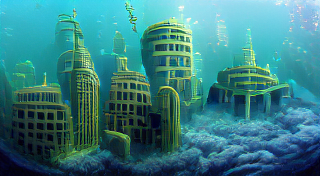

iter: 210, loss: 1.43096, losses: 0.711822, 0.719142
iter: 220, loss: 1.45191, losses: 0.717725, 0.73418


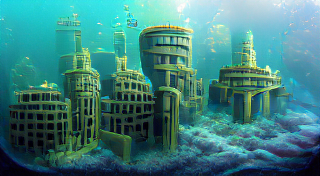

iter: 230, loss: 1.43255, losses: 0.707851, 0.724701
iter: 240, loss: 1.42627, losses: 0.710266, 0.716003


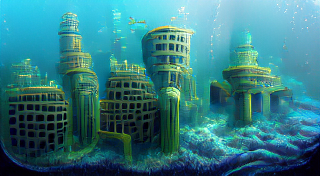

iter: 250, loss: 1.43962, losses: 0.71141, 0.728208
iter: 260, loss: 1.42014, losses: 0.702099, 0.718044


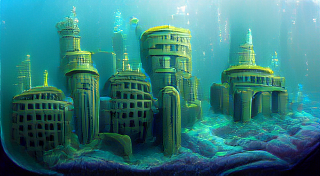

iter: 270, loss: 1.3901, losses: 0.688128, 0.701973
iter: 280, loss: 1.43149, losses: 0.709227, 0.722258


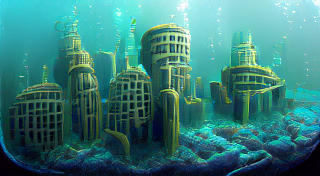

iter: 290, loss: 1.43355, losses: 0.708787, 0.72476
iter: 300, loss: 1.4218, losses: 0.700989, 0.720808


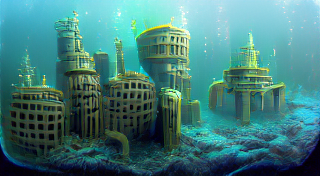

iter: 310, loss: 1.41666, losses: 0.702946, 0.713717
iter: 320, loss: 1.42751, losses: 0.705755, 0.72175


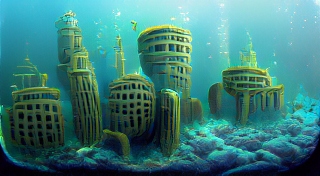

iter: 330, loss: 1.42764, losses: 0.710557, 0.717082
iter: 340, loss: 1.42157, losses: 0.704492, 0.717076


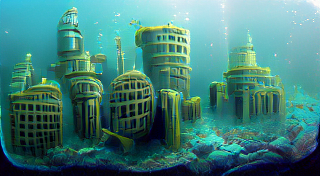

iter: 350, loss: 1.38284, losses: 0.680637, 0.702205


In [ ]:
myfunction(prompts="underwater city")

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt
Using device: cuda:0
Optimising using: Adam
Using text prompts: ['Gold Dryer']
Using seed: 5097956536025841147


0it [00:00, ?it/s]

iter: 0, loss: 1.87013, losses: 0.932984, 0.937151


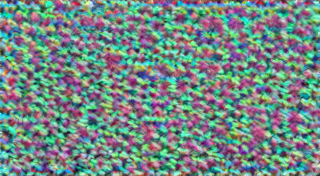

iter: 10, loss: 1.69685, losses: 0.847494, 0.849359
iter: 20, loss: 1.63243, losses: 0.814532, 0.817901


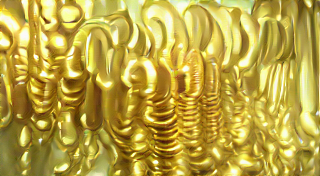

iter: 30, loss: 1.58425, losses: 0.797603, 0.786645
iter: 40, loss: 1.58525, losses: 0.794337, 0.790914


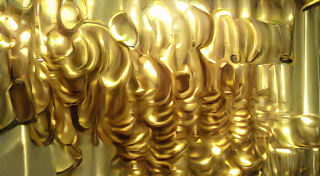

iter: 50, loss: 1.55974, losses: 0.782239, 0.777498
iter: 60, loss: 1.51265, losses: 0.75948, 0.753165


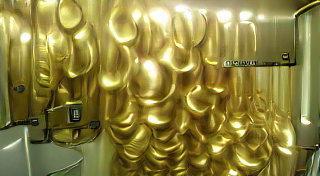

iter: 70, loss: 1.53575, losses: 0.77114, 0.764609
iter: 80, loss: 1.54218, losses: 0.772904, 0.769277


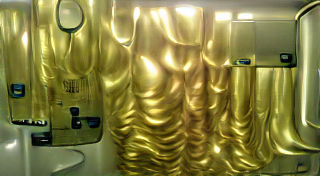

iter: 90, loss: 1.49004, losses: 0.750395, 0.739646
iter: 100, loss: 1.51022, losses: 0.760325, 0.749899


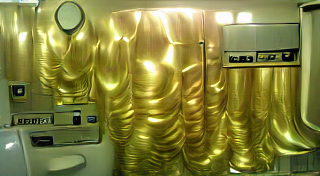

iter: 110, loss: 1.49793, losses: 0.756679, 0.741248
iter: 120, loss: 1.48312, losses: 0.741644, 0.741474


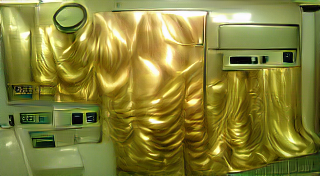

iter: 130, loss: 1.4848, losses: 0.748169, 0.736632
iter: 140, loss: 1.4391, losses: 0.723068, 0.716036


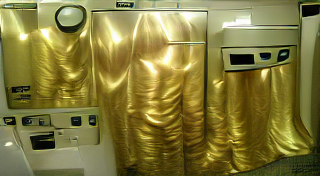

iter: 150, loss: 1.47272, losses: 0.738214, 0.734504
iter: 160, loss: 1.40335, losses: 0.703938, 0.699415


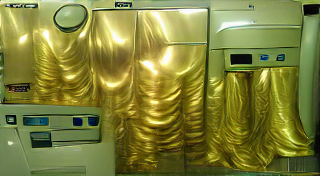

iter: 170, loss: 1.47976, losses: 0.748984, 0.73078
iter: 180, loss: 1.45388, losses: 0.735237, 0.718639


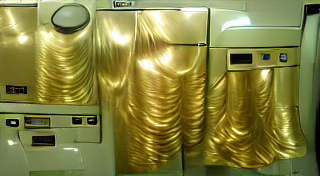

iter: 190, loss: 1.48377, losses: 0.746409, 0.737357
iter: 200, loss: 1.39732, losses: 0.704106, 0.693217


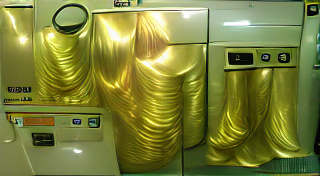

iter: 210, loss: 1.45735, losses: 0.734806, 0.722547
iter: 220, loss: 1.4391, losses: 0.724729, 0.714371


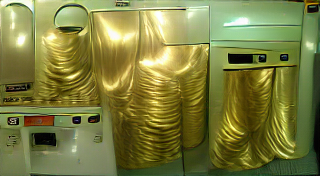

iter: 230, loss: 1.39833, losses: 0.706272, 0.692055
iter: 240, loss: 1.45751, losses: 0.738525, 0.718986


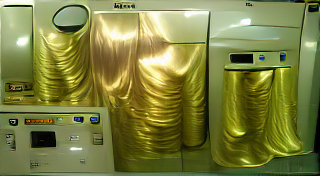

iter: 250, loss: 1.43882, losses: 0.721625, 0.7172
iter: 260, loss: 1.38651, losses: 0.699881, 0.686631


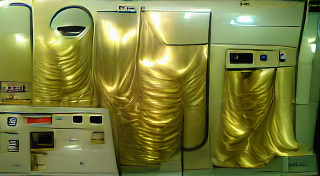

iter: 270, loss: 1.4928, losses: 0.746166, 0.746632
iter: 280, loss: 1.45246, losses: 0.732938, 0.719518


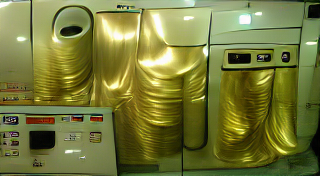

iter: 290, loss: 1.44291, losses: 0.726294, 0.716618
iter: 300, loss: 1.43345, losses: 0.720401, 0.713052


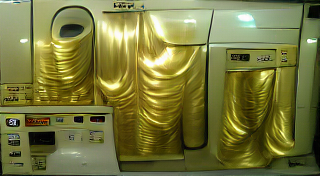

iter: 310, loss: 1.4549, losses: 0.729559, 0.725345
iter: 320, loss: 1.38596, losses: 0.698435, 0.687521


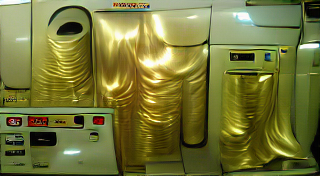

iter: 330, loss: 1.4523, losses: 0.727318, 0.724977
iter: 340, loss: 1.44096, losses: 0.722466, 0.718493


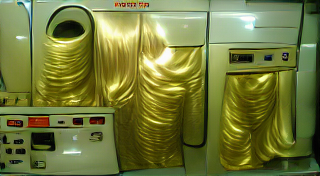

iter: 350, loss: 1.43739, losses: 0.721505, 0.715886


In [ ]:
myfunction(prompts="Gold Dryer")

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt
Using device: cuda:0
Optimising using: Adam
Using text prompts: ['Shoes']
Using seed: 1616386103822136748


0it [00:00, ?it/s]

iter: 0, loss: 1.82401, losses: 0.909851, 0.914163


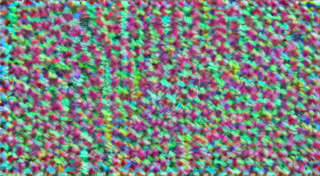

iter: 10, loss: 1.66225, losses: 0.842585, 0.81967
iter: 20, loss: 1.61091, losses: 0.814983, 0.795927


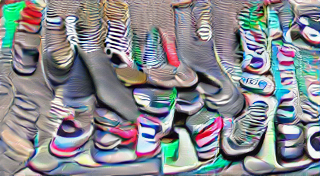

iter: 30, loss: 1.60048, losses: 0.802176, 0.798308
iter: 40, loss: 1.56643, losses: 0.787551, 0.778877


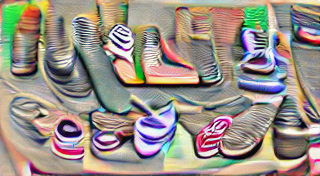

iter: 50, loss: 1.56792, losses: 0.787119, 0.780799
iter: 60, loss: 1.55162, losses: 0.779353, 0.772266


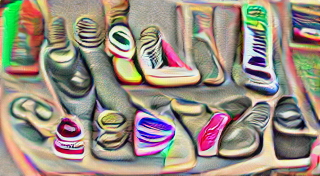

iter: 70, loss: 1.55219, losses: 0.779039, 0.773149
iter: 80, loss: 1.56547, losses: 0.788636, 0.776831


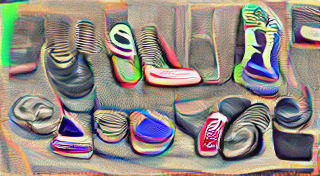

iter: 90, loss: 1.53652, losses: 0.770739, 0.765781
iter: 100, loss: 1.53004, losses: 0.766271, 0.763766


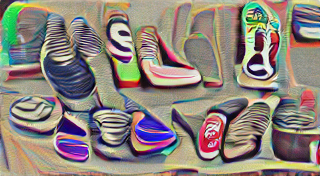

iter: 110, loss: 1.55603, losses: 0.782207, 0.773824
iter: 120, loss: 1.54728, losses: 0.77612, 0.771155


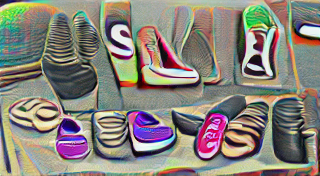

iter: 130, loss: 1.5183, losses: 0.76172, 0.75658
iter: 140, loss: 1.53555, losses: 0.772182, 0.763373


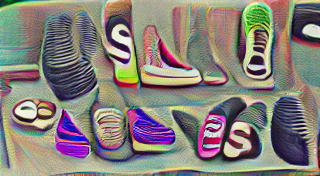

iter: 150, loss: 1.55147, losses: 0.77679, 0.774681
iter: 160, loss: 1.53676, losses: 0.770657, 0.766108


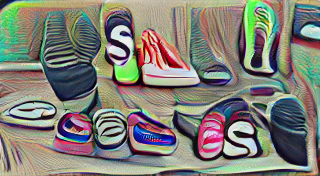

iter: 170, loss: 1.51345, losses: 0.758015, 0.755438
iter: 180, loss: 1.5483, losses: 0.777622, 0.770679


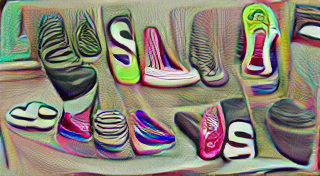

iter: 190, loss: 1.54221, losses: 0.773263, 0.768948
iter: 200, loss: 1.51373, losses: 0.758939, 0.754791


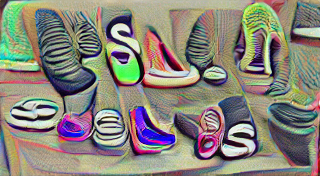

iter: 210, loss: 1.53973, losses: 0.773226, 0.766504
iter: 220, loss: 1.51133, losses: 0.759236, 0.752097


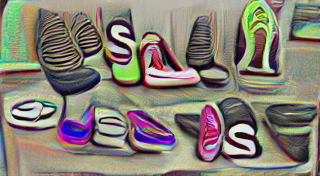

iter: 230, loss: 1.53908, losses: 0.771886, 0.767195
iter: 240, loss: 1.51861, losses: 0.759281, 0.759331


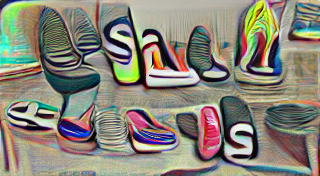

iter: 250, loss: 1.52665, losses: 0.766549, 0.760103
iter: 260, loss: 1.49055, losses: 0.744134, 0.746415


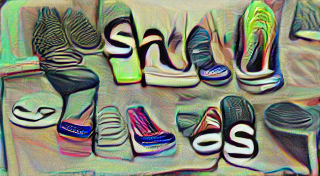

iter: 270, loss: 1.53548, losses: 0.765543, 0.769941
iter: 280, loss: 1.52818, losses: 0.764931, 0.763249


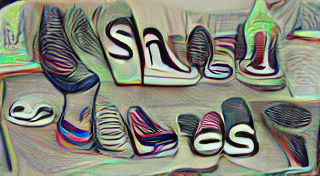

iter: 290, loss: 1.51725, losses: 0.762093, 0.755162
iter: 300, loss: 1.49261, losses: 0.743347, 0.749267


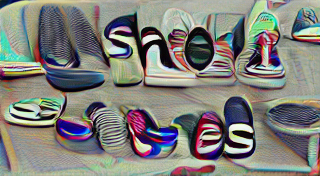

iter: 310, loss: 1.51323, losses: 0.758352, 0.754878
iter: 320, loss: 1.48395, losses: 0.741878, 0.74207


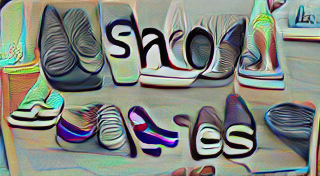

iter: 330, loss: 1.51356, losses: 0.761911, 0.751652
iter: 340, loss: 1.51268, losses: 0.75701, 0.755671


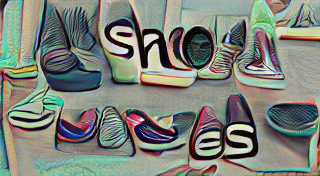

iter: 350, loss: 1.48149, losses: 0.742312, 0.739175


In [ ]:
myfunction(prompts="Shoes")

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt
Using device: cuda:0
Optimising using: Adam
Using text prompts: ['Purple Pans']
Using seed: 2167675566123845542


0it [00:00, ?it/s]

iter: 0, loss: 1.86778, losses: 0.918667, 0.949113


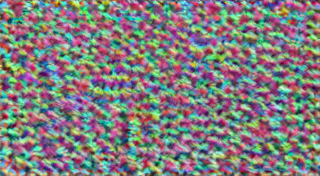

iter: 10, loss: 1.71352, losses: 0.839749, 0.873773
iter: 20, loss: 1.67501, losses: 0.819672, 0.855339


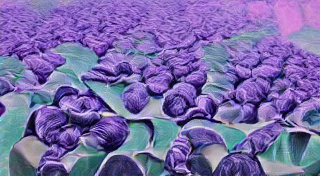

iter: 30, loss: 1.61591, losses: 0.7974, 0.818513
iter: 40, loss: 1.58742, losses: 0.777322, 0.810099


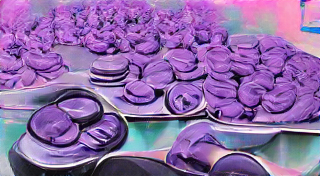

iter: 50, loss: 1.53947, losses: 0.763348, 0.776126
iter: 60, loss: 1.5404, losses: 0.766846, 0.773558


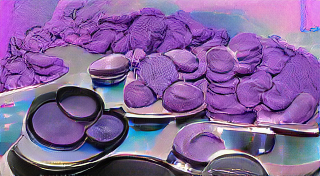

iter: 70, loss: 1.53146, losses: 0.760225, 0.771235
iter: 80, loss: 1.47022, losses: 0.741458, 0.728766


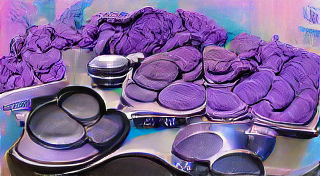

iter: 90, loss: 1.5021, losses: 0.753847, 0.748257
iter: 100, loss: 1.49866, losses: 0.759113, 0.739549


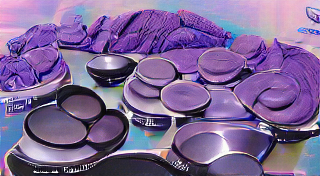

iter: 110, loss: 1.44546, losses: 0.731218, 0.714241
iter: 120, loss: 1.46595, losses: 0.748169, 0.717783


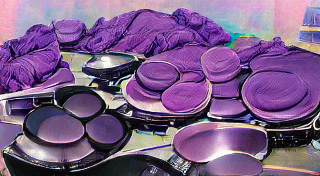

iter: 130, loss: 1.47043, losses: 0.748112, 0.722319
iter: 140, loss: 1.46676, losses: 0.745488, 0.721268


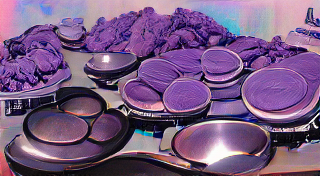

iter: 150, loss: 1.48006, losses: 0.744952, 0.735107
iter: 160, loss: 1.46415, losses: 0.743079, 0.721071


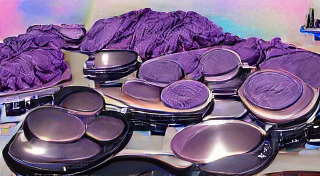

iter: 170, loss: 1.45125, losses: 0.735911, 0.715334
iter: 180, loss: 1.47075, losses: 0.745926, 0.724823


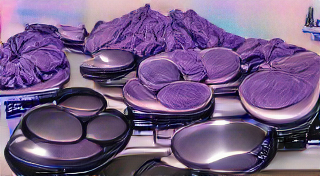

iter: 190, loss: 1.45207, losses: 0.733696, 0.71837
iter: 200, loss: 1.45748, losses: 0.742947, 0.714536


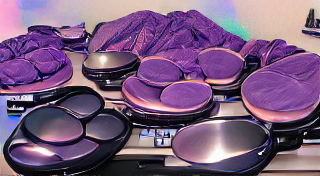

iter: 210, loss: 1.46646, losses: 0.741503, 0.72496
iter: 220, loss: 1.46401, losses: 0.747819, 0.716187


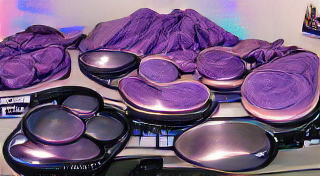

iter: 230, loss: 1.45369, losses: 0.739439, 0.714247
iter: 240, loss: 1.45341, losses: 0.741024, 0.712388


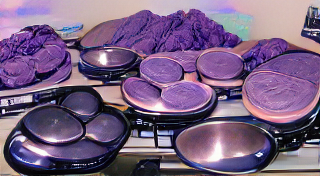

iter: 250, loss: 1.46535, losses: 0.744221, 0.721131
iter: 260, loss: 1.40412, losses: 0.716634, 0.687487


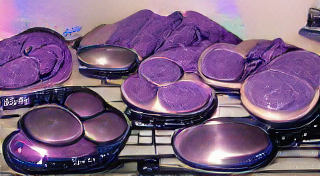

iter: 270, loss: 1.4249, losses: 0.72648, 0.698416
iter: 280, loss: 1.44258, losses: 0.737172, 0.705406


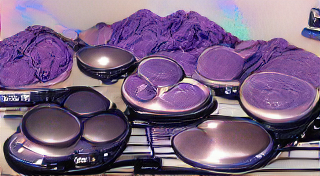

iter: 290, loss: 1.46053, losses: 0.746341, 0.714189
iter: 300, loss: 1.4549, losses: 0.740438, 0.714459


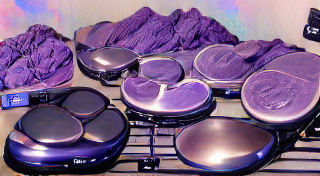

iter: 310, loss: 1.4152, losses: 0.722317, 0.692886
iter: 320, loss: 1.43589, losses: 0.732, 0.703888


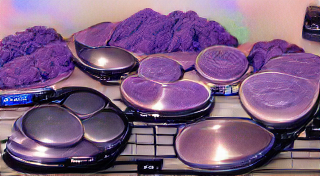

iter: 330, loss: 1.44421, losses: 0.7384, 0.705807
iter: 340, loss: 1.42408, losses: 0.728349, 0.695734


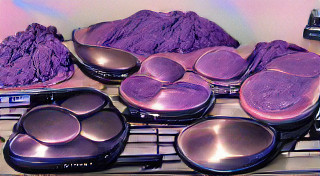

iter: 350, loss: 1.39599, losses: 0.717561, 0.678425


In [ ]:
myfunction(prompts="Purple Pans")

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt
Using device: cuda:0
Optimising using: Adam
Using text prompts: ['white saucer']
Using seed: 10219253839566121363


0it [00:00, ?it/s]

iter: 0, loss: 1.84886, losses: 0.908822, 0.94004


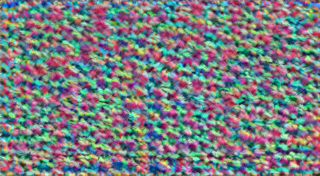

iter: 10, loss: 1.72565, losses: 0.857742, 0.867912
iter: 20, loss: 1.65875, losses: 0.824659, 0.834091


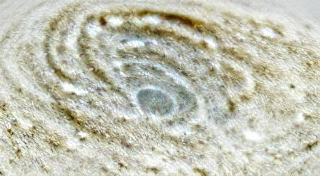

iter: 30, loss: 1.6378, losses: 0.817353, 0.820448
iter: 40, loss: 1.62764, losses: 0.814938, 0.812699


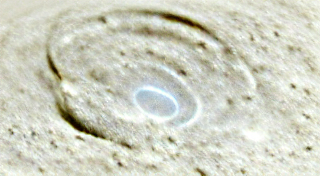

iter: 50, loss: 1.6055, losses: 0.805299, 0.800202
iter: 60, loss: 1.59718, losses: 0.79788, 0.799302


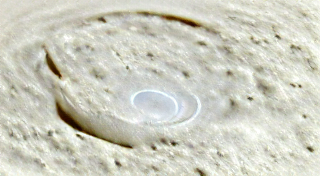

iter: 70, loss: 1.60521, losses: 0.804613, 0.800599
iter: 80, loss: 1.60064, losses: 0.798372, 0.802269


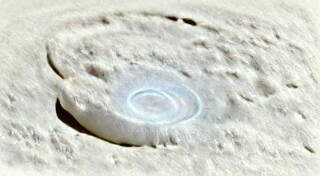

iter: 90, loss: 1.59887, losses: 0.796564, 0.802302
iter: 100, loss: 1.56844, losses: 0.785448, 0.782994


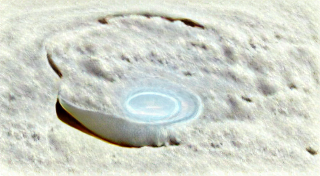

iter: 110, loss: 1.55288, losses: 0.775579, 0.777303
iter: 120, loss: 1.57912, losses: 0.785779, 0.793344


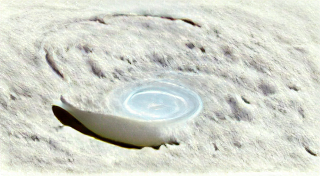

iter: 130, loss: 1.55587, losses: 0.775092, 0.780777
iter: 140, loss: 1.55322, losses: 0.763796, 0.789424


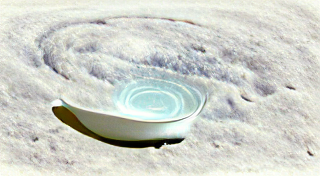

iter: 150, loss: 1.55187, losses: 0.761526, 0.790347
iter: 160, loss: 1.54484, losses: 0.759734, 0.785109


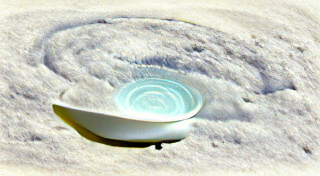

iter: 170, loss: 1.54586, losses: 0.753149, 0.792709
iter: 180, loss: 1.55529, losses: 0.761211, 0.794081


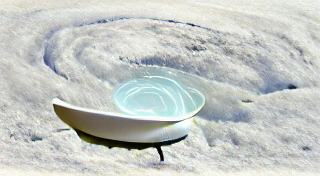

iter: 190, loss: 1.5227, losses: 0.744652, 0.778046
iter: 200, loss: 1.56067, losses: 0.767856, 0.792814


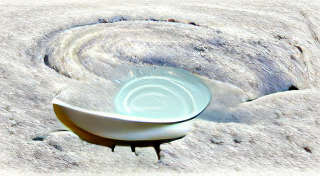

iter: 210, loss: 1.49946, losses: 0.733218, 0.766246
iter: 220, loss: 1.52929, losses: 0.745942, 0.783344


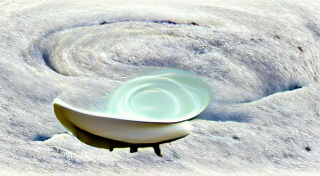

iter: 230, loss: 1.53035, losses: 0.746804, 0.783549
iter: 240, loss: 1.49313, losses: 0.736074, 0.757052


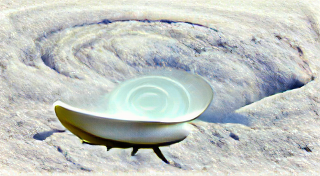

iter: 250, loss: 1.54307, losses: 0.755359, 0.787707
iter: 260, loss: 1.53419, losses: 0.751347, 0.782841


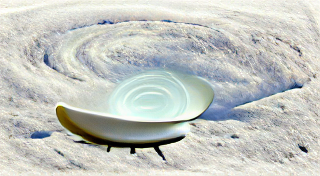

iter: 270, loss: 1.53469, losses: 0.751082, 0.783604
iter: 280, loss: 1.52513, losses: 0.746727, 0.7784


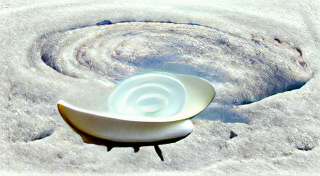

iter: 290, loss: 1.52573, losses: 0.745697, 0.780029
iter: 300, loss: 1.52195, losses: 0.744999, 0.776952


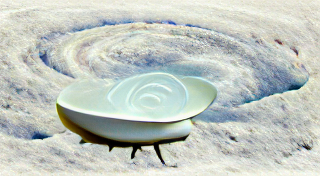

iter: 310, loss: 1.50613, losses: 0.73804, 0.768095
iter: 320, loss: 1.52281, losses: 0.741954, 0.780857


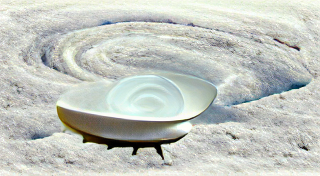

iter: 330, loss: 1.51649, losses: 0.738161, 0.778333
iter: 340, loss: 1.49579, losses: 0.739024, 0.756768


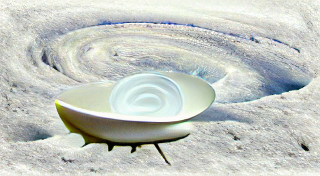

iter: 350, loss: 1.52086, losses: 0.744243, 0.776613


In [ ]:
myfunction(prompts="white saucer")